# We Rate Dogs Project 2

_Prepared by **Wambui Nicole**_

The purpose of this project is to query data fromt he WeRateDogs Twitter page and get some insights about their postings. We will be gathering data through manual download, programmatic download and API querying.

Thereafter, the data will be cleaned and assessed using both visual and programmatic methods so that we can generate some useful insights about their postings.

## Gathering

For this section, we are going to get 3 different files in 3 different ways highlighted below:


| File Name | Source | Method |
|:--- |:--- |:--- |
| `twitter-archive-enhanced.csv` | Udacity Server | Manual Download |
| `image-predictions.tsv` | Udacity Server | Programmatic Download (requests library) |
| `tweet_json.txt` | To be created /Twitter | Tweepy API |


1. **Twitter Archive Download**

In [1]:
import pandas as pd

In [2]:
#upload the twitter_archive_enhanced file using pandas

archive = pd.read_csv("twitter-archive-enhanced.csv")

In [3]:
#get an overview of the dataframe

archive.head(4)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None


2. **Image Predictions Download**

In [4]:
#programmatically download the image_predictions.tsv file from the Udacity server

import requests

url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

In [5]:
#test that the code worked. We should get a Requests 200 response

response

<Response [200]>

In [6]:
#save it to the directory and check the file is visible

with open('image-predictions.tsv', mode = 'wb') as file:
        file.write(response.content)

In [3]:
#import the image-predictions.tsv file and check it out

pimages = pd.read_csv('image-predictions.tsv', sep= '\t') #remember to add the tab to make the data easily readable
pimages.head(4)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True


3. **Json File creation and tweet download**

In [4]:
#use Tweepy API import the data from the WeRateDogs twitter page and save it into a file.

#start by loading the API keys (remember to delete these later because we are not suing config parsers)
import tweepy
import json
from tweepy import OAuthHandler
from timeit import default_timer as timer

consumer_key = 'BVSq5f6gd0mVi5aUxuSzk6j2g'
consumer_secret = 'h4nRNVGtAXJkxc63s9ZirNHZ12zt4jHVTCUORiDeG7X9pWCdVD'
access_token = 'AAAAAAAAAAAAAAAAAAAAADOvgQEAAAAAo028I3V2xUh%2FYZmiGy5eWU%2BxslM%3DTvedlVow3muyDzcrwDnSoZkVjGiziqv5B3di4sXO5moYUYRzDP'
access_secret = 'OiTpeiNwyR56mzGjSMyjzAo0sGmRJz80SnItQjdj632AB'
#the API keys have been included due to the feedback received during my project review. These will not work if run as they are because I have regenerated new ones for account safety.

In [6]:

auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

api = tweepy.API(auth, wait_on_rate_limit=True) #rate limit helps us time how much time is left as the code executes

tweet_ids = archive.tweet_id.values
len(tweet_ids)

count = 0
failed_tweets = {}
start = timer()

with open('tweet_json.txt', 'w') as outfile: #to save in the json file "tweet_json"
    for tweet_id in tweet_ids:
        count += 1
        print(str(count) + ": " + str(tweet_id))
        try:
            tweet = api.get_status(tweet_id, tweet_mode='extended')
            print("Success")
            json.dump(tweet._json, outfile)
            outfile.write('\n')
        except tweepy.errors.TweepyException as e: #changed from tweepy.TweepError as per stack overflow suggester here <https://stackoverflow.com/questions/68412800/tweeperror-attribute-error-when-using-tweepy>
            print("Fail")
            failed_tweets[tweet_id] = e
            pass

end = timer()
print(end - start)
print(failed_tweets)

#NOTE: This code will result in the json file having many more columns that its actually supposed to. We will need to drop the irrelevant columns once its done executing.

1: 892420643555336193


Rate limit reached. Sleeping for: 61


Success
2: 892177421306343426
Success
3: 891815181378084864
Success
4: 891689557279858688
Success
5: 891327558926688256
Success
6: 891087950875897856
Success
7: 890971913173991426
Success
8: 890729181411237888
Success
9: 890609185150312448
Success
10: 890240255349198849
Success
11: 890006608113172480
Success
12: 889880896479866881
Success
13: 889665388333682689
Success
14: 889638837579907072
Success
15: 889531135344209921
Success
16: 889278841981685760
Success
17: 888917238123831296
Success
18: 888804989199671297
Success
19: 888554962724278272
Success
20: 888202515573088257
Fail
21: 888078434458587136
Success
22: 887705289381826560
Success
23: 887517139158093824
Success
24: 887473957103951883
Success
25: 887343217045368832
Success
26: 887101392804085760
Success
27: 886983233522544640
Success
28: 886736880519319552
Success
29: 886680336477933568
Success
30: 886366144734445568
Success
31: 886267009285017600
Success
32: 886258384151887873
Success
33: 886054160059072513
Success
34: 8859848

Success
263: 842765311967449089
Success
264: 842535590457499648
Success
265: 842163532590374912
Success
266: 842115215311396866
Success
267: 841833993020538882
Success
268: 841680585030541313
Success
269: 841439858740625411
Success
270: 841320156043304961
Success
271: 841314665196081154
Success
272: 841077006473256960
Success
273: 840761248237133825
Success
274: 840728873075638272
Success
275: 840698636975636481
Success
276: 840696689258311684
Success
277: 840632337062862849
Success
278: 840370681858686976
Success
279: 840268004936019968
Success
280: 839990271299457024
Success
281: 839549326359670784
Success
282: 839290600511926273
Success
283: 839239871831150596
Success
284: 838952994649550848
Success
285: 838921590096166913
Success
286: 838916489579200512
Success
287: 838831947270979586
Success
288: 838561493054533637
Success
289: 838476387338051585
Success
290: 838201503651401729
Success
291: 838150277551247360
Success
292: 838085839343206401
Success
293: 838083903487373313
Success


Success
520: 810284430598270976
Success
521: 810254108431155201
Success
522: 809920764300447744
Success
523: 809808892968534016
Success
524: 809448704142938112
Success
525: 809220051211603969
Success
526: 809084759137812480
Success
527: 808838249661788160
Success
528: 808733504066486276
Success
529: 808501579447930884
Success
530: 808344865868283904
Success
531: 808134635716833280
Success
532: 808106460588765185
Success
533: 808001312164028416
Success
534: 807621403335917568
Success
535: 807106840509214720
Success
536: 807059379405148160
Success
537: 807010152071229440
Success
538: 806629075125202948
Success
539: 806620845233815552
Success
540: 806576416489959424
Success
541: 806542213899489280
Success
542: 806242860592926720
Success
543: 806219024703037440
Success
544: 805958939288408065
Success
545: 805932879469572096
Success
546: 805826884734976000
Success
547: 805823200554876929
Success
548: 805520635690676224
Success
549: 805487436403003392
Success
550: 805207613751304193
Success


Success
777: 776113305656188928
Success
778: 776088319444877312
Success
779: 775898661951791106
Success
780: 775842724423557120
Success
781: 775733305207554048
Success
782: 775729183532220416
Success
783: 775364825476165632
Success
784: 775350846108426240
Success
785: 775096608509886464
Fail
786: 775085132600442880
Success
787: 774757898236878852
Success
788: 774639387460112384
Success
789: 774314403806253056
Success
790: 773985732834758656
Success
791: 773922284943896577
Success
792: 773704687002451968
Success
793: 773670353721753600
Success
794: 773547596996571136
Success
795: 773336787167145985
Success
796: 773308824254029826
Success
797: 773247561583001600
Success
798: 773191612633579521
Success
799: 772877495989305348
Success
800: 772826264096874500
Success
801: 772615324260794368
Success
802: 772581559778025472
Success
803: 772193107915964416
Success
804: 772152991789019136
Success
805: 772117678702071809
Success
806: 772114945936949249
Success
807: 772102971039580160
Success
808

Rate limit reached. Sleeping for: 286


Fail
902: 758474966123810816
Success
903: 758467244762497024
Success
904: 758405701903519748
Success
905: 758355060040593408
Success
906: 758099635764359168
Success
907: 758041019896193024
Success
908: 757741869644341248
Success
909: 757729163776290825
Success
910: 757725642876129280
Success
911: 757611664640446465
Success
912: 757597904299253760
Success
913: 757596066325864448
Success
914: 757400162377592832
Success
915: 757393109802180609
Success
916: 757354760399941633
Success
917: 756998049151549440
Success
918: 756939218950160384
Success
919: 756651752796094464
Success
920: 756526248105566208
Success
921: 756303284449767430
Success
922: 756288534030475264
Success
923: 756275833623502848
Success
924: 755955933503782912
Success
925: 755206590534418437
Success
926: 755110668769038337
Success
927: 754874841593970688
Success
928: 754856583969079297
Success
929: 754747087846248448
Success
930: 754482103782404096
Success
931: 754449512966619136
Success
932: 754120377874386944
Success
933

Success
1154: 725729321944506368
Success
1155: 725458796924002305
Success
1156: 724983749226668032
Success
1157: 724771698126512129
Success
1158: 724405726123311104
Success
1159: 724049859469295616
Success
1160: 724046343203856385
Success
1161: 724004602748780546
Success
1162: 723912936180330496
Success
1163: 723688335806480385
Success
1164: 723673163800948736
Success
1165: 723179728551723008
Success
1166: 722974582966214656
Success
1167: 722613351520608256
Success
1168: 721503162398597120
Success
1169: 721001180231503872
Success
1170: 720785406564900865
Success
1171: 720775346191278080
Success
1172: 720415127506415616
Success
1173: 720389942216527872
Success
1174: 720340705894408192
Success
1175: 720059472081784833
Success
1176: 720043174954147842
Success
1177: 719991154352222208
Success
1178: 719704490224398336
Success
1179: 719551379208073216
Success
1180: 719367763014393856
Success
1181: 719339463458033665
Success
1182: 719332531645071360
Success
1183: 718971898235854848
Success
11

Success
1403: 699423671849451520
Success
1404: 699413908797464576
Success
1405: 699370870310113280
Success
1406: 699323444782047232
Success
1407: 699088579889332224
Success
1408: 699079609774645248
Success
1409: 699072405256409088
Success
1410: 699060279947165696
Success
1411: 699036661657767936
Success
1412: 698989035503689728
Success
1413: 698953797952008193
Success
1414: 698907974262222848
Success
1415: 698710712454139905
Success
1416: 698703483621523456
Success
1417: 698635131305795584
Success
1418: 698549713696649216
Success
1419: 698355670425473025
Success
1420: 698342080612007937
Success
1421: 698262614669991936
Success
1422: 698195409219559425
Success
1423: 698178924120031232
Success
1424: 697995514407682048
Success
1425: 697990423684476929
Success
1426: 697943111201378304
Success
1427: 697881462549430272
Success
1428: 697630435728322560
Success
1429: 697616773278015490
Success
1430: 697596423848730625
Success
1431: 697575480820686848
Success
1432: 697516214579523584
Success
14

Success
1652: 683498322573824003
Success
1653: 683481228088049664
Success
1654: 683462770029932544
Success
1655: 683449695444799489
Success
1656: 683391852557561860
Success
1657: 683357973142474752
Success
1658: 683142553609318400
Success
1659: 683111407806746624
Success
1660: 683098815881154561
Success
1661: 683078886620553216
Success
1662: 683030066213818368
Success
1663: 682962037429899265
Success
1664: 682808988178739200
Success
1665: 682788441537560576
Success
1666: 682750546109968385
Success
1667: 682697186228989953
Success
1668: 682662431982772225
Success
1669: 682638830361513985
Success
1670: 682429480204398592
Success
1671: 682406705142087680
Success
1672: 682393905736888321
Success
1673: 682389078323662849
Success
1674: 682303737705140231
Success
1675: 682259524040966145
Success
1676: 682242692827447297
Success
1677: 682088079302213632
Success
1678: 682059653698686977
Success
1679: 682047327939461121
Success
1680: 682032003584274432
Success
1681: 682003177596559360
Success
16

Rate limit reached. Sleeping for: 272


Fail
1803: 676949632774234114
Success
1804: 676948236477857792
Success
1805: 676946864479084545
Success
1806: 676942428000112642
Success
1807: 676936541936185344
Success
1808: 676916996760600576
Success
1809: 676897532954456065
Success
1810: 676864501615042560
Success
1811: 676821958043033607
Success
1812: 676819651066732545
Success
1813: 676811746707918848
Success
1814: 676776431406465024
Success
1815: 676617503762681856
Success
1816: 676613908052996102
Success
1817: 676606785097199616
Success
1818: 676603393314578432
Success
1819: 676593408224403456
Success
1820: 676590572941893632
Success
1821: 676588346097852417
Success
1822: 676582956622721024
Success
1823: 676575501977128964
Success
1824: 676533798876651520
Success
1825: 676496375194980353
Success
1826: 676470639084101634
Success
1827: 676440007570247681
Success
1828: 676430933382295552
Success
1829: 676263575653122048
Success
1830: 676237365392908289
Success
1831: 676219687039057920
Success
1832: 676215927814406144
Success
1833:

Success
2052: 671488513339211776
Success
2053: 671486386088865792
Success
2054: 671485057807351808
Success
2055: 671390180817915904
Success
2056: 671362598324076544
Success
2057: 671357843010908160
Success
2058: 671355857343524864
Success
2059: 671347597085433856
Success
2060: 671186162933985280
Success
2061: 671182547775299584
Success
2062: 671166507850801152
Success
2063: 671163268581498880
Success
2064: 671159727754231808
Success
2065: 671154572044468225
Success
2066: 671151324042559489
Success
2067: 671147085991960577
Success
2068: 671141549288370177
Success
2069: 671138694582165504
Success
2070: 671134062904504320
Success
2071: 671122204919246848
Success
2072: 671115716440031232
Success
2073: 671109016219725825
Success
2074: 670995969505435648
Success
2075: 670842764863651840
Success
2076: 670840546554966016
Success
2077: 670838202509447168
Success
2078: 670833812859932673
Success
2079: 670832455012716544
Success
2080: 670826280409919488
Success
2081: 670823764196741120
Success
20

Success
2301: 667062181243039745
Success
2302: 667044094246576128
Success
2303: 667012601033924608
Success
2304: 666996132027977728
Success
2305: 666983947667116034
Success
2306: 666837028449972224
Success
2307: 666835007768551424
Success
2308: 666826780179869698
Success
2309: 666817836334096384
Success
2310: 666804364988780544
Success
2311: 666786068205871104
Success
2312: 666781792255496192
Success
2313: 666776908487630848
Success
2314: 666739327293083650
Success
2315: 666701168228331520
Success
2316: 666691418707132416
Success
2317: 666649482315059201
Success
2318: 666644823164719104
Success
2319: 666454714377183233
Success
2320: 666447344410484738
Success
2321: 666437273139982337
Success
2322: 666435652385423360
Success
2323: 666430724426358785
Success
2324: 666428276349472768
Success
2325: 666421158376562688
Success
2326: 666418789513326592
Success
2327: 666411507551481857
Success
2328: 666407126856765440
Success
2329: 666396247373291520
Success
2330: 666373753744588802
Success
23

In [22]:
#given that the file is a txt file but in json formatting, we can either import the entire file as a df and drop columns. Or directly extract the info we need.

#try loading the file first 
tweets = open('tweet_json.txt', 'r', encoding='utf-8').read() #source <https://stackoverflow.com/questions/67068567/how-to-get-utf-8-text-file-into-a-json-object-in-python-3>
tweets

'{"created_at": "Tue Aug 01 16:23:56 +0000 2017", "id": 892420643555336193, "id_str": "892420643555336193", "full_text": "This is Phineas. He\'s a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU", "truncated": false, "display_text_range": [0, 85], "entities": {"hashtags": [], "symbols": [], "user_mentions": [], "urls": [], "media": [{"id": 892420639486877696, "id_str": "892420639486877696", "indices": [86, 109], "media_url": "http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "media_url_https": "https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg", "url": "https://t.co/MgUWQ76dJU", "display_url": "pic.twitter.com/MgUWQ76dJU", "expanded_url": "https://twitter.com/dog_rates/status/892420643555336193/photo/1", "type": "photo", "sizes": {"thumb": {"w": 150, "h": 150, "resize": "crop"}, "medium": {"w": 540, "h": 528, "resize": "fit"}, "small": {"w": 540, "h": 528, "resize": "fit"}, "large": {"w": 540, "h": 528, "resize": "fit"}}}]}, "extended_entities": {"med

In [52]:
#extract relevant data (tweet_id, retweet_count and favourite count*) into a pandas data frame.

import pandas as pd
import numpy as np

tweets_list = []

with open('tweet_json.txt', 'r') as file:
    for tweet in file:
        tweets = json.loads(tweet)
        tweet_id = tweets['id']
        retweet_count = tweets['retweet_count']
        favorite_count = tweets['favorite_count']
        
        tweets_list.append({'tweet_id':tweet_id,
                            'retweet_count':retweet_count,
                            'favorite_count':favorite_count
                           })
        
tweets_v2 = pd.DataFrame(tweets_list, columns = ['tweet_id', 'retweet_count', 'favorite_count'])
tweets_v2

,tweet_id,retweet_count,favorite_count
0,892420643555336193,6972,33700
1,892177421306343426,5274,29228
2,891815181378084864,3464,21975
3,891689557279858688,7192,36794
4,891327558926688256,7719,35187
...,...,...,...
2320,666049248165822465,36,88
2321,666044226329800704,115,246
2322,666033412701032449,36,100
2323,666029285002620928,39,112


In [54]:
tweets_df = tweets_v2

tweets_df.to_csv('tweets.csv', index=False)

## Assessing

For this section, the goal is to identify:

> _**8** quality issues_
>
>  _**2** tidiness issues_

We are to use both _visual assessment_ and _programmatic assessment_ to identify these issues. Below are some important things to note about the datasets:

- Only use original ratings that have images i.e. **no retweets**. _Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets._
- Some of the rating numerators are greater than the denominators. This is a unique rating system of WeRateDogs, **it does not need to be cleaned**.
- There's no need to gather the tweets beyond **August 1st, 2017** because you won't be able to gather the image predictions for these tweets.


### Dataset #1: `twitter-archive-enhanced.csv`

**Step 1:** Use visual assessment to look through any issues in the dataset. This shall be done here by simply loading the dataset, and also in Excel.

In [4]:
import pandas as pd
archive = pd.read_csv("twitter-archive-enhanced.csv")
archive

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None


**Step 2:** Use programmatic assessment to  identify quality and tidiness issues

In [2]:
archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [4]:
archive.name.value_counts()

None          745
a              55
Charlie        12
Cooper         11
Lucy           11
             ... 
Dex             1
Ace             1
Tayzie          1
Grizzie         1
Christoper      1
Name: name, Length: 957, dtype: int64

Quality issues noted:
- Column values with "NaN" and "None" values like `in_reply_to_status_id`,	`in_reply_to_user_id`, `retweeted_status_id`,	`retweeted_status_user_id`,	`retweeted_status_timestamp`, `doggo`, `floofer`, `pupper` and `puppo`.
- Name column with values like `None` and `a`.
- `expanded_url` column only has 2297 calues rather than 2356, indicating some missing data.
- `name` column has **745** values as "None" and **55** as "a" which indicates invalid and incomplete data.
- All the data related to retweets i.e `retweeted_status_id`,	`retweeted_status_user_id` and	`retweeted_status_timestamp` needs to be removed because it is outside of our project scope and will not have any associated images in the `image-predictions.tsv` file.
- `tweet_id` has been listed as an integer datatype.


Tidiness issues noted:
- Timestamp values have a date value, a time and a timezone value in one column.

### Dataset #2: `image-predictions.tsv`

**Step 1:** Use visual assessment to look through any issues in the dataset. This shall be done here by simply loading the dataset, and also in Excel.

In [5]:
pimages = pd.read_csv('image-predictions.tsv', sep = '\t')
pimages

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True


In [15]:
#note that dog names sometimes have underscores, sometimes in some names are capitalised and others arent (consistency), and some predicted names are not dognames, there are colour names and miscellaneous items. 

**Step 2:** Use programmatic assessment to  identify quality and tidiness issues

In [12]:
pimages.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [25]:
pimages.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [27]:
#predictions are supposed to be between 0 and 1, having a values that is 1 or over indicates anomlies in the data for p1_conf
pimages.query("p1_conf >= 1")

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
106,667866724293877760,https://pbs.twimg.com/media/CUS9PlUWwAANeAD.jpg,1,jigsaw_puzzle,1.0,False,prayer_rug,1.011300e-08,False,doormat,1.740170e-10,False


Quality issues noted:
- Column names `p1`, `p1_conf` would not make much sense to someone viewing the data. 
- Row #106 has a prediction 1 value of 1, which may not be accurate. 
- Dog names are not consitent. They are titled sometimes, or completely lowercase.
- `tweet_id` has been listed as an integer datatype.

### Dataset #3: `tweet_json.txt`

**Step 1:** Use visual assessment to look through any issues in the dataset. This shall be done here by simply loading the dataset, and also in Excel.

In [6]:
tweets =pd.read_csv('tweets.csv')
tweets

,tweet_id,retweet_count,favorite_count
0,892420643555336193,6972,33700
1,892177421306343426,5274,29228
2,891815181378084864,3464,21975
3,891689557279858688,7192,36794
4,891327558926688256,7719,35187
...,...,...,...
2320,666049248165822465,36,88
2321,666044226329800704,115,246
2322,666033412701032449,36,100
2323,666029285002620928,39,112


**Step 2:** Use programmatic assessment to identify quality and tidiness issues

In [33]:
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2325 entries, 0 to 2324
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2325 non-null   int64
 1   retweet_count   2325 non-null   int64
 2   favorite_count  2325 non-null   int64
dtypes: int64(3)
memory usage: 54.6 KB


In [41]:
tweets.tweet_id.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2320    False
2321    False
2322    False
2323    False
2324    False
Name: tweet_id, Length: 2325, dtype: bool

Quality Issues noted:
- `tweet_id` has been listed as an integer datatype.

Tidiness Issues noted:

- This data would make more sense if it was part of the twitter archive dataset.

### Observations
So far, below are the quality and tidiness issues we need to take care of:

> **Quality Issues:**

`archive` table:

1. All the data related to retweets i.e retweeted_status_id, retweeted_status_user_id and retweeted_status_timestamp needs to be removed because it is outside of our project scope and will not have any associated images in the image-predictions.tsv file.
2. Expanded_url column only has 2297 calues rather than 2356, indicating some missing data.
3. Timestamp column is listed as object dtype rather than date-time.
4. Column values with "NaN" values like in_reply_to_status_id and in_reply_to_user_id.
5. Doggo, floofer, pupper and puppo columns don't have complete data.


`pimages` table:

6. Column names p1, p1_conf,p2, p2_conf, p3 and p3_conf would not make much sense to someone viewing the data.
7. Dog names are not consistent. They are titled sometimes, or completely lowercase

`tweets` table:

8. Tweet_id has been listed as an integer datatype.



> **Tidiness Issues:**

`archive` table:

1. Timestamp values have a date value, a time and a timezone value in one column.

`tweets` table:

2. This data would make more sense if it was part of the twitter archive and image predictions dataset.

## Cleaning

In this step, the focus will be to work on the documented issues highlighted above. The fist thing we would need to do is make copies of all the data:

In [74]:
#copying the files ensures we have a backup of the original dataset incase of anything.
archive_2 = archive.copy()

In [44]:
pimages_2 = pimages.copy()

In [45]:
tweets_2 =  tweets.copy()

### Issue #1

All the data related to retweets i.e retweeted_status_id, retweeted_status_user_id and retweeted_status_timestamp needs to be  removed because it is outside of our project scope and will not have any associated images in the image-predictions.tsv file

#### Define:

- Remove the rows that are retweets by using `notnull()` function, then drop the retweet-related columns


#### Code:

In [75]:
archive_2 = archive_2.drop(archive_2[(archive_2.retweeted_status_timestamp.notnull())].index)

In [76]:
archive_2 = archive_2.drop('retweeted_status_id', axis=1)
archive_2 = archive_2.drop('retweeted_status_user_id', axis=1)
archive_2 = archive_2.drop('retweeted_status_timestamp', axis=1)

#### Test:

In [77]:
archive_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   tweet_id               2175 non-null   int64  
 1   in_reply_to_status_id  78 non-null     float64
 2   in_reply_to_user_id    78 non-null     float64
 3   timestamp              2175 non-null   object 
 4   source                 2175 non-null   object 
 5   text                   2175 non-null   object 
 6   expanded_urls          2117 non-null   object 
 7   rating_numerator       2175 non-null   int64  
 8   rating_denominator     2175 non-null   int64  
 9   name                   2175 non-null   object 
 10  doggo                  2175 non-null   object 
 11  floofer                2175 non-null   object 
 12  pupper                 2175 non-null   object 
 13  puppo                  2175 non-null   object 
dtypes: float64(2), int64(3), object(9)
memory usage: 254.9+ 

In [49]:
# confirm we have removed everything by adding the current # of entries(2175) with the #of retweet entries(181). Formerly 2356.
print(2175+181)

2356


### Issue #2: 

Expanded_url column only has 2297 values rather than 2356, indicating some missing data.

> **Note:** After testing the previous code, we can see this issue has been resolved after removing the retweet data.

### Issue #3:

Timestamp column is listed as object dtype rather than date-time

#### Define:

Change the dtype of the timestamp column from object to date-time.

#### Code: 

In [78]:
#use pandas astype() function to convert the datatype
archive_2['timestamp'] = archive_2['timestamp'].astype('datetime64[ns]')

#### Test:

In [79]:
#confirm if the code was suffessful by using info()
archive_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   tweet_id               2175 non-null   int64         
 1   in_reply_to_status_id  78 non-null     float64       
 2   in_reply_to_user_id    78 non-null     float64       
 3   timestamp              2175 non-null   datetime64[ns]
 4   source                 2175 non-null   object        
 5   text                   2175 non-null   object        
 6   expanded_urls          2117 non-null   object        
 7   rating_numerator       2175 non-null   int64         
 8   rating_denominator     2175 non-null   int64         
 9   name                   2175 non-null   object        
 10  doggo                  2175 non-null   object        
 11  floofer                2175 non-null   object        
 12  pupper                 2175 non-null   object        
 13  pup

### Issue #4:
Column values with "NaN" values like `in_reply_to_status_id` and `in_reply_to_user_id`.

#### Define:

Remove the `in_reply_to_status_id` and `in_reply_to_user_id` columns.

#### Code:

In [80]:
#because the drop() function has been used a lot, I can define my own function to avoid repetition.

def drop(df,column):
    return df.drop(column, axis=1)

In [81]:
archive_2 = drop(archive_2, 'in_reply_to_status_id')

In [82]:
archive_2 = drop(archive_2, 'in_reply_to_user_id')

#### Test:

In [55]:
archive_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2175 non-null   int64         
 1   timestamp           2175 non-null   datetime64[ns]
 2   source              2175 non-null   object        
 3   text                2175 non-null   object        
 4   expanded_urls       2117 non-null   object        
 5   rating_numerator    2175 non-null   int64         
 6   rating_denominator  2175 non-null   int64         
 7   name                2175 non-null   object        
 8   doggo               2175 non-null   object        
 9   floofer             2175 non-null   object        
 10  pupper              2175 non-null   object        
 11  puppo               2175 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(8)
memory usage: 220.9+ KB


### Issue #5:

Doggo, floofer, pupper and puppo columns don't have complete data.

> Note: This issue is both a quality and tidiness issue. This is because the data is incomplete and can also be represented in a cleaner format because ti reperesents dog stages. However, since the data is incomplete, it will be treated as a quality issue.

#### Define:

Remove the `doggo`, `floofer`, `pupper` and `puppo` columns.

#### Code:

In [83]:
archive_2 = drop(archive_2,'doggo')
archive_2 = drop(archive_2,'floofer')
archive_2 = drop(archive_2,'pupper')
archive_2 = drop(archive_2,'puppo')

#### Test:

In [57]:
#confirm the columns have been removed.
archive_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2175 non-null   int64         
 1   timestamp           2175 non-null   datetime64[ns]
 2   source              2175 non-null   object        
 3   text                2175 non-null   object        
 4   expanded_urls       2117 non-null   object        
 5   rating_numerator    2175 non-null   int64         
 6   rating_denominator  2175 non-null   int64         
 7   name                2175 non-null   object        
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 152.9+ KB


### Quality Issue #6:

Column names p1, p1_conf,p2, p2_conf, p3 and p3_conf would not make much sense to someone viewing the data.

#### Define:

Rename the `p1`, `p1_conf`, `p2`, `p2_conf`, `p3` and `p3_conf` columns to names that would make more sense.

#### Code:

In [58]:
#use rename() to change to colnames.
pimages_2.rename(columns = {'p1':'prediction_1','p1_conf':'p1_confidence','p2':'prediction_2','p2_conf':'p2_confidence','p3':'prediction_3','p3_conf':'p3_confidence'}, inplace = True)

#### Test:

In [59]:
pimages_2.head(2)

,tweet_id,jpg_url,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True


### Issue #7:

Dog names are not consistent. They are titled sometimes, or completely lowercase

#### Define:
Change the prediction names to "title" case (convert the first letter to uppercase) using title().

#### Code:

In [60]:
pimages_2['prediction_1'] = pimages_2.prediction_1.str.title()
pimages_2['prediction_2'] = pimages_2.prediction_2.str.title()
pimages_2['prediction_3'] = pimages_2.prediction_3.str.title()

#### Test:

In [61]:
pimages_2.sample(5)

,tweet_id,jpg_url,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
1012,709519240576036864,https://pbs.twimg.com/media/Cdi3-f7W8AUOm9T.jpg,1,Cocker_Spaniel,0.414982,True,Newfoundland,0.225482,True,Flat-Coated_Retriever,0.196789,True
821,693095443459342336,https://pbs.twimg.com/media/CZ5entwWYAAocEg.jpg,1,Ice_Lolly,0.660099,False,Neck_Brace,0.039563,False,Yorkshire_Terrier,0.033488,True
1334,757741869644341248,https://pbs.twimg.com/media/CoQKNY7XYAE_cuX.jpg,1,Skunk,0.609715,False,Old_English_Sheepdog,0.128899,True,Siberian_Husky,0.019076,True
1456,777641927919427584,https://pbs.twimg.com/media/CmoPdmHW8AAi8BI.jpg,1,Golden_Retriever,0.964929,True,Labrador_Retriever,0.011584,True,Refrigerator,0.007499,False
1266,749395845976588288,https://pbs.twimg.com/media/CmZjizYW8AA3FCN.jpg,1,Pomeranian,0.973715,True,Chow,0.020758,True,Keeshond,0.003784,True


### Issue #8:

Tweet id has been listed as an integer.

> Note: This issue has been noted in all dataframes, and needs to be changed.

#### Define:

Convert `tweet_id` from integer to object datatype.

#### Code:

In [84]:
tweets_2['tweet_id'] = tweets_2['tweet_id'].astype('object')
archive_2['tweet_id'] = archive_2['tweet_id'].astype('object')
pimages_2['tweet_id'] = pimages_2['tweet_id'].astype('object')

#### Test:

In [63]:
tweets_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2325 entries, 0 to 2324
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   tweet_id        2325 non-null   object
 1   retweet_count   2325 non-null   int64 
 2   favorite_count  2325 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 54.6+ KB


In [64]:
archive_2.info()
pimages_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2175 non-null   object        
 1   timestamp           2175 non-null   datetime64[ns]
 2   source              2175 non-null   object        
 3   text                2175 non-null   object        
 4   expanded_urls       2117 non-null   object        
 5   rating_numerator    2175 non-null   int64         
 6   rating_denominator  2175 non-null   int64         
 7   name                2175 non-null   object        
dtypes: datetime64[ns](1), int64(2), object(5)
memory usage: 152.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   tweet_id       2075 non-null   object 
 1   jpg_url        2075

### Tidiness Issue #1:

Timestamp values have a date value, a time and a timezone value in one column.

#### Define:

Split the `timestamp` column into date and time columns, remove the time zone because we don't need it.

#### Code:

In [89]:
archive_2['date'] = archive_2['timestamp'].dt.date
archive_2['time'] = archive_2['timestamp'].dt.time

In [90]:
archive_2 = drop(archive_2,'timestamp')

#### Test:

In [91]:
archive_2.head(3)

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,2017-08-01,16:23:56
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,2017-08-01,00:17:27
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,2017-07-31,00:18:03


In [92]:
archive_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_id            2175 non-null   object
 1   source              2175 non-null   object
 2   text                2175 non-null   object
 3   expanded_urls       2117 non-null   object
 4   rating_numerator    2175 non-null   int64 
 5   rating_denominator  2175 non-null   int64 
 6   name                2175 non-null   object
 7   date                2175 non-null   object
 8   time                2175 non-null   object
dtypes: int64(2), object(7)
memory usage: 169.9+ KB


In [97]:
#because the cleaning process is iterative, we can go back and fixed the datatype for the date column.
archive_2['date'] = archive_2['date'].astype('datetime64[ns]')
#note, the time column was not converted due to the inadvertent date added once converted on its own.

In [98]:
archive_2.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,2017-08-01,16:23:56
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,2017-08-01,00:17:27
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,2017-07-31,00:18:03
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,2017-07-30,15:58:51
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,2017-07-29,16:00:24


### Tidiness Issue #2:

This data(tweets) would make more sense if it was part of the twitter archive and image predictions dataset.

#### Define:

Merge all the datasets using the tweet_id column.

#### Code:

In [99]:
tweets_archive_cleaned = pd.merge(archive_2, tweets_2,
                            on=['tweet_id'], how='left')

In [100]:
tweets_archive_cleaned_2 = pd.merge(tweets_archive_cleaned, pimages_2,
                                   on=['tweet_id'], how='left')

#### Test:

In [101]:
tweets_archive_cleaned_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2174
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2175 non-null   object        
 1   source              2175 non-null   object        
 2   text                2175 non-null   object        
 3   expanded_urls       2117 non-null   object        
 4   rating_numerator    2175 non-null   int64         
 5   rating_denominator  2175 non-null   int64         
 6   name                2175 non-null   object        
 7   date                2175 non-null   datetime64[ns]
 8   time                2175 non-null   object        
 9   retweet_count       2165 non-null   float64       
 10  favorite_count      2165 non-null   float64       
 11  jpg_url             1994 non-null   object        
 12  img_num             1994 non-null   float64       
 13  prediction_1        1994 non-null   object      

In [103]:
tweets_archive_cleaned_2.sample(5)

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time,retweet_count,...,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
222,843604394117681152,"<a href=""http://twitter.com/download/iphone"" r...",This is Hank. He's been outside for 3 minutes ...,https://twitter.com/dog_rates/status/843604394...,11,10,Hank,2017-03-19,23:25:35,2475.0,...,1.0,Labrador_Retriever,0.430583,True,Golden_Retriever,0.263581,True,Great_Pyrenees,0.179385,True
2117,667070482143944705,"<a href=""http://twitter.com/download/iphone"" r...",After much debate this dog is being upgraded t...,NaN,10,10,None,2015-11-18,20:02:51,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
786,751132876104687617,"<a href=""http://twitter.com/download/iphone"" r...",This is Cooper. He's just so damn happy. 10/10...,https://twitter.com/dog_rates/status/751132876...,10,10,Cooper,2016-07-07,19:16:47,1179.0,...,1.0,Labrador_Retriever,0.929390,True,Chesapeake_Bay_Retriever,0.038254,True,Golden_Retriever,0.007610,True
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,2017-08-01,00:17:27,5274.0,...,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True
1431,685532292383666176,"<a href=""http://twitter.com/download/iphone"" r...","For the last time, WE. DO. NOT. RATE. BULBASAU...",https://twitter.com/dog_rates/status/685532292...,9,10,None,2016-01-08,18:43:29,1043.0,...,1.0,White_Wolf,0.318524,False,Dingo,0.215436,False,Collie,0.095805,True


We can see that the 3 datasets had different numbers of entries (or rows), so we need to fix that. It also appears that entries with no expanded URL have no data on the predicted images dataset.

### Tidiness Issue #3

The merged dataset has different numbers of entries per column, due to different numbers of entries in each previous dataset.

#### Define:

Remove the extra rows with no jpg_urls so that there are 1994 total entries in the merged dataset. (i.e. _each tweet_id should have a corresponding jpg url_)

#### Code:

In [104]:
tweets_archive_cleaned_2 = tweets_archive_cleaned_2.drop(tweets_archive_cleaned_2[(tweets_archive_cleaned_2.jpg_url.isnull())].index)

In [135]:
tweets_archive_cleaned_2.reset_index(drop=True, inplace=True) #this code resets the index because we are dropping columns.

#### Test:

In [120]:
tweets_archive_cleaned_2.sample(5)

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time,retweet_count,...,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
422,801538201127157760,"<a href=""http://twitter.com/download/iphone"" r...",This is Wallace. He'll be your chau-fur this e...,https://twitter.com/dog_rates/status/801538201...,12,10,Wallace,2016-11-23,21:29:33,1946.0,...,1.0,Pembroke,0.550506,True,Cardigan,0.306612,True,Shetland_Sheepdog,0.054230,True
1682,671561002136281088,"<a href=""http://twitter.com/download/iphone"" r...",This is the best thing I've ever seen so sprea...,https://twitter.com/dog_rates/status/671561002...,13,10,the,2015-12-01,05:26:34,6298.0,...,1.0,Gordon_Setter,0.469373,True,Black-And-Tan_Coonhound,0.270893,True,Rottweiler,0.153233,True
358,814638523311648768,"<a href=""http://twitter.com/download/iphone"" r...",This is Olivia. She's a passionate advocate of...,https://twitter.com/dog_rates/status/814638523...,12,10,Olivia,2016-12-30,01:05:33,2515.0,...,2.0,Golden_Retriever,0.650814,True,Kuvasz,0.053281,True,Cocker_Spaniel,0.035440,True
1865,668291999406125056,"<a href=""http://twitter.com/download/iphone"" r...",I can't do better than he did. 10/10 https://t...,https://twitter.com/dog_rates/status/668291999...,10,10,None,2015-11-22,04:56:43,28.0,...,1.0,Web_Site,0.995535,False,Skunk,0.001363,False,Badger,0.000686,False
1765,670408998013820928,"<a href=""http://twitter.com/download/iphone"" r...",This is Peanut. He was the World Table Tennis ...,https://twitter.com/dog_rates/status/670408998...,10,10,Peanut,2015-11-28,01:08:55,187.0,...,1.0,Ping-Pong_Ball,0.999945,False,Tennis_Ball,0.000018,False,Racket,0.000015,False


In [121]:
tweets_archive_cleaned_2.jpg_url.isnull()

0       False
1       False
2       False
3       False
4       False
        ...  
1989    False
1990    False
1991    False
1992    False
1993    False
Name: jpg_url, Length: 1994, dtype: bool

In [122]:
tweets_archive_cleaned_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            1994 non-null   object        
 1   source              1994 non-null   object        
 2   text                1994 non-null   object        
 3   expanded_urls       1994 non-null   object        
 4   rating_numerator    1994 non-null   int64         
 5   rating_denominator  1994 non-null   int64         
 6   name                1994 non-null   object        
 7   date                1994 non-null   datetime64[ns]
 8   time                1994 non-null   object        
 9   retweet_count       1984 non-null   float64       
 10  favorite_count      1984 non-null   float64       
 11  jpg_url             1994 non-null   object        
 12  img_num             1994 non-null   float64       
 13  prediction_1        1994 non-null   object      

In [127]:
tweets_archive_cleaned_2.retweet_count.isnull().sum()

10

In [128]:
tweets_archive_cleaned_2.favorite_count.isnull().sum()

10

> **Note:** Cleaning is iterative. Given that the retweet_count and favorite_count columns now have 10 less entries than the other columns in the dataset, we need to fix that. 

#### Define(2):

The retweet_count and favorite_count columns have 10 rows with null values. Remove the rows with null values.

#### Code(2):

In [130]:
tweets_archive_cleaned_2 = tweets_archive_cleaned_2.drop(tweets_archive_cleaned_2[(tweets_archive_cleaned_2.retweet_count.isnull())].index)
tweets_archive_cleaned_2 = tweets_archive_cleaned_2.drop(tweets_archive_cleaned_2[(tweets_archive_cleaned_2.favorite_count.isnull())].index)
tweets_archive_cleaned_2.reset_index(drop=True, inplace=True)

#### Test(2):

In [133]:
tweets_archive_cleaned_2.sample(6)

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time,retweet_count,...,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
490,788412144018661376,"<a href=""http://twitter.com/download/iphone"" r...",This is Dexter. He breaks hearts for a living....,https://twitter.com/dog_rates/status/788412144...,11,10,Dexter,2016-10-18,16:11:17,4907.0,...,1.0,Golden_Retriever,0.805238,True,Labrador_Retriever,0.113798,True,Brittany_Spaniel,0.038559,True
51,880935762899988482,"<a href=""http://twitter.com/download/iphone"" r...",This is Louis. He's crossing. It's a big deal....,https://twitter.com/dog_rates/status/880935762...,13,10,Louis,2017-06-30,23:47:07,2325.0,...,1.0,Street_Sign,0.251801,False,Umbrella,0.115123,False,Traffic_Light,0.069534,False
1745,670442337873600512,"<a href=""http://twitter.com/download/iphone"" r...",Meet Koda. He's large. Looks very soft. Great ...,https://twitter.com/dog_rates/status/670442337...,11,10,Koda,2015-11-28,03:21:24,175.0,...,1.0,Sussex_Spaniel,0.403552,True,Otterhound,0.256302,True,Irish_Terrier,0.187315,True
1566,674038233588723717,"<a href=""http://twitter.com/download/iphone"" r...",This is Kaiya. She's an aspiring shoe model. 1...,https://twitter.com/dog_rates/status/674038233...,12,10,Kaiya,2015-12-08,01:30:12,366.0,...,1.0,Eskimo_Dog,0.358459,True,Norwegian_Elkhound,0.206963,True,Malamute,0.148236,True
407,804026241225523202,"<a href=""http://twitter.com/download/iphone"" r...",This is Bo. He's going to make me cry. 13/10 p...,https://twitter.com/dog_rates/status/804026241...,13,10,Bo,2016-11-30,18:16:08,14972.0,...,1.0,Web_Site,0.492709,False,Envelope,0.050566,False,Guillotine,0.015297,False
590,770772759874076672,"<a href=""http://twitter.com/download/iphone"" r...",This is Sebastian. He's super h*ckin fluffy. T...,https://twitter.com/dog_rates/status/770772759...,11,10,Sebastian,2016-08-30,23:58:40,1320.0,...,1.0,Chow,0.979515,True,Golden_Retriever,0.010219,True,Pomeranian,0.004606,True


In [131]:
tweets_archive_cleaned_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1984 entries, 0 to 1983
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            1984 non-null   object        
 1   source              1984 non-null   object        
 2   text                1984 non-null   object        
 3   expanded_urls       1984 non-null   object        
 4   rating_numerator    1984 non-null   int64         
 5   rating_denominator  1984 non-null   int64         
 6   name                1984 non-null   object        
 7   date                1984 non-null   datetime64[ns]
 8   time                1984 non-null   object        
 9   retweet_count       1984 non-null   float64       
 10  favorite_count      1984 non-null   float64       
 11  jpg_url             1984 non-null   object        
 12  img_num             1984 non-null   float64       
 13  prediction_1        1984 non-null   object      

> The dataset can now be exported and saved as a csv file.

## Storing Data

The cleaned and merged dataset needs to be exporeted and saved as `twitter_archive_master.csv` for the before we can go on to the insights and analysis.

In [132]:
### Saving the files

tweets_archive_cleaned_2.to_csv('twitter_archive_master.csv', index=False)

## Analysing and Visualising Data

Now that the data has been cleaned and compiled, the goal of this section is to produce:

> - **3** insights
>
> - **1** visualisation


### Insights:

In order to get some insights, we would need to do some exploratory data analysis.

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

In [3]:
df = pd.read_csv('twitter_archive_master.csv')

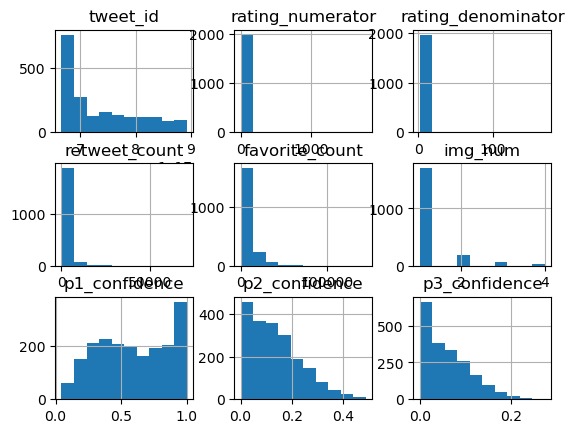

In [5]:
df.hist();

In [20]:
df.p1_confidence.describe()

count    1984.000000
mean        0.593234
std         0.272008
min         0.044333
25%         0.362063
50%         0.587222
75%         0.844247
max         1.000000
Name: p1_confidence, dtype: float64

In [22]:
df.p2_confidence.describe()

count    1.984000e+03
mean     1.345372e-01
std      1.006281e-01
min      1.011300e-08
25%      5.401683e-02
50%      1.175870e-01
75%      1.952647e-01
max      4.880140e-01
Name: p2_confidence, dtype: float64

In [19]:
df.p3_confidence.describe()

count    1.984000e+03
mean     6.038238e-02
std      5.093481e-02
min      1.740170e-10
25%      1.623400e-02
50%      4.959335e-02
75%      9.174633e-02
max      2.734190e-01
Name: p3_confidence, dtype: float64

In [24]:
#store confidence variables (mean) in a list to visualise them later
confidence_list = [0.593234, 1.345372e-01, 6.038238e-02]

- The mean values of the prediction confidence are `0.593234` for the first prediction, `1.345372e-01` for the second prediction and `6.038238e-02` for the third prediction.

In [26]:
df.retweet_count.describe()

count     1984.000000
mean      2233.965726
std       4001.616972
min         11.000000
25%        492.750000
50%       1076.500000
75%       2546.750000
max      70351.000000
Name: retweet_count, dtype: float64

In [27]:
df.favorite_count.describe()

count      1984.000000
mean       7685.788810
std       11337.677914
min          66.000000
25%        1627.250000
50%        3445.000000
75%        9518.500000
max      144286.000000
Name: favorite_count, dtype: float64

- The highest number of retweets achieved by a tweet was `70,351` and the highest number of favorites was `144,286`

In [37]:
df.query('retweet_count == 70351.000000')

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time,retweet_count,...,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
767,744234799360020481,"<a href=""http://twitter.com/download/iphone"" r...",Here's a doggo realizing you can stand in a po...,https://twitter.com/dog_rates/status/744234799...,13,10,None,2016-06-18,18:26:18,70351.0,...,1.0,Labrador_Retriever,0.825333,True,Ice_Bear,0.044681,False,Whippet,0.018442,True


In [40]:
df.query('favorite_count == 144286.000000')

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,date,time,retweet_count,...,img_num,prediction_1,p1_confidence,p1_dog,prediction_2,p2_confidence,p2_dog,prediction_3,p3_confidence,p3_dog
767,744234799360020481,"<a href=""http://twitter.com/download/iphone"" r...",Here's a doggo realizing you can stand in a po...,https://twitter.com/dog_rates/status/744234799...,13,10,None,2016-06-18,18:26:18,70351.0,...,1.0,Labrador_Retriever,0.825333,True,Ice_Bear,0.044681,False,Whippet,0.018442,True


- The tweet with the highest number of retweets and favorites is `tweet id# 744234799360020481`

In summary, the insights from our data are:

> **Insight 1:** *The mean values of the prediction confidence are `0.593234` for the first prediction, `1.345372e-01` for the second prediction and `6.038238e-02` for the third prediction.*
>
> **Insight 2:** *The highest number of retweets achieved by a tweet was `70,351` and the highest number of favorites was `144,286`.*
>
> **Insight 3:** *The tweet with the highest number of retweets and favorites is `tweet id# 744234799360020481`.*

### Visualisation:

In [42]:
#I want to plot the prediction confidence levels for each prediction using the list we created (confidence_list)

def plt_labels(a,b,c): #not necessary, but just creating a defined function to simplify the code later.
    plt.title(a)
    plt.xlabel(b)
    plt.ylabel(c)

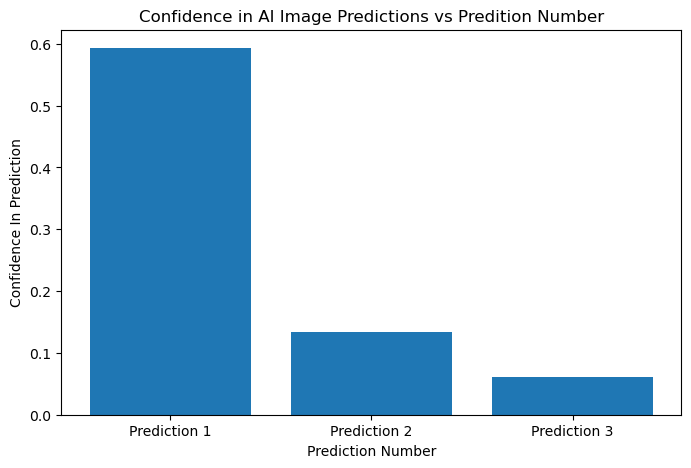

In [43]:
colors = ['array'] #blue is for scholarship beneficiaries and orange is for sms non beneficiaries
plt.subplots(figsize=(8, 5))
plt.bar(("Prediction 1", "Prediction 2", "Prediction 3"),[confidence_list[0], confidence_list[1], confidence_list[2]])
plt_labels('Confidence in AI Image Predictions vs Prediction Number','Prediction Number', 'Confidence In Prediction')

- From this visualisation, we can see that generally, the neural network used usually has the highest confidence rating on its first try and significantly drops on the second and third predictions.